# QUESTION 2

In [1]:
import torch 
import torch.nn as nn
import torch.optim as optim
import torchvision 
import torchvision.transforms as transforms
import torchvision.datasets as datasets
import matplotlib.pyplot as plt
from torchvision.utils import save_image, make_grid
import numpy as np
import matplotlib.animation as animation
from IPython.display import HTML


# Dataset parameters
latent_dim = 100
image_size = 32 * 32 * 3
img = (3, 32, 32)
batch_size = 128

/home/wahab/.local/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


## Use GPU

In [2]:
if torch.cuda.is_available():
    print("CUDA is available")
    print("CUDA device name: ", torch.cuda.get_device_name(0))
    # use CUDA device
    print("Using CUDA device")  
    device = torch.device("cuda")
else:
    device = torch.device("cpu")
    print("CUDA is not available")
    print("Using CPU device")

CUDA is available
CUDA device name:  NVIDIA GeForce RTX 3060
Using CUDA device


In [3]:
# load the data set 

transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize([0.5], [0.5], [0.5])
])


train_data = datasets.CIFAR10(root="data", train=True, download=True, transform=transform)
print(train_data.data.shape)

# take only two classes cats and dogs
train_data.targets = torch.tensor(train_data.targets)
cat_idx = train_data.targets == 3
dog_idx = train_data.targets == 5
idx = cat_idx # | dog_idx

print("Cats", cat_idx.sum(), "Dogs", dog_idx.sum()) # total cats and dogs images

# remove other targets and data 
train_data.targets = train_data.targets[idx]
train_data.data = train_data.data[idx]

# 0 for cats and 1 for dogs
train_data.targets = torch.tensor([0 if target == 3 else 1 for target in train_data.targets])
train_data.classes = ["cat", "dog"]
train_loader = torch.utils.data.DataLoader(train_data, batch_size=batch_size, shuffle=True)



Files already downloaded and verified
(50000, 32, 32, 3)
Cats tensor(5000) Dogs tensor(5000)


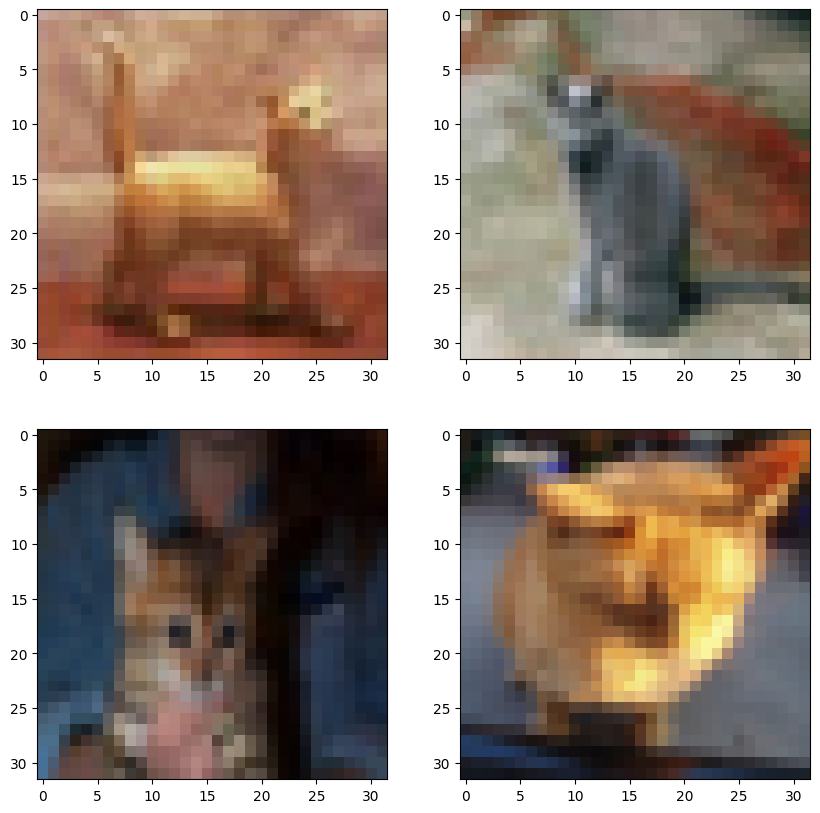

In [4]:
data = iter(train_loader)
images, labels = next(data)

def unnormalize(image):
    image = (image / 2) + 0.5
    return image

def plot_image(images, labels):
    plt.figure(figsize=(10, 10))
    for i in range(4):
        plt.subplot(2, 2, i+1)
        img = unnormalize(images[i])
        plt.imshow(img.permute(1, 2, 0)) # change the order of the image channels
    plt.show()

def show_generated_images(images, epoch):
    plt.figure(figsize=(10, 10))
    for i in range(len(images)):
        plt.subplot(8, 8, i+1)
        plt.imshow(images[i].permute(1, 2, 0).cpu().detach().numpy())
        plt.axis('off')
    plt.suptitle(f"Epoch {epoch}")
    plt.show()

plot_image(images, labels)

In [5]:
# custom weights initialization called on ``netG`` and ``netD``
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

# DCGAN

In [26]:
# Siamese Network
class SiameseNetwork(nn.Module):
    def __init__(self):
        super(SiameseNetwork, self).__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(3, 64, 5),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(2, 2),
            nn.Conv2d(64, 128, 5),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(2, 2)
        )
        self.fc = nn.Sequential(
            nn.Linear(128 * 5 * 5, 256),
            nn.ReLU(inplace=True),
            nn.Linear(256, 256),
            nn.ReLU(inplace=True),
            nn.Linear(256, 2)
        )
        self.apply(weights_init)
    
    def forward_once(self, x):
        x = self.conv(x)
        x = x.view(x.size()[0], -1)
        x = self.fc(x)
        return x
    
    def forward(self, input1, input2):
        output1 = self.forward_once(input1)
        output2 = self.forward_once(input2)
        return output1

In [27]:
# Define the Contrastive Loss Function
class ContrastiveLoss(torch.nn.Module):
    def __init__(self, margin=2.0):
        super(ContrastiveLoss, self).__init__()
        self.margin = margin

    def forward(self, output1, output2, label):
      # Calculate the euclidean distance and calculate the contrastive loss
      euclidean_distance = F.pairwise_distance(output1, output2, keepdim = True)

      loss_contrastive = torch.mean((1-label) * torch.pow(euclidean_distance, 2) +
                                    (label) * torch.pow(torch.clamp(self.margin - euclidean_distance, min=0.0), 2))


      return loss_contrastive

In [28]:
# Generator Code
class DCGenerator(nn.Module):
    def __init__(self):
        super(DCGenerator, self).__init__()
        self.main = nn.Sequential(
            # input is Z, going into a convolution
            nn.ConvTranspose2d(latent_dim, 512, 4, 1, 0, bias=False),
            nn.BatchNorm2d(512),
            nn.ReLU(True),
            # state size. ``(img[1]*8) x 4 x 4``
            nn.ConvTranspose2d(512, 256, 4, 2, 1, bias=False),
            nn.BatchNorm2d(256),
            nn.ReLU(True),
            # state size. ``(img[1]*4) x 8 x 8``
            nn.ConvTranspose2d( 256, 128, 4, 2, 1, bias=False),
            nn.BatchNorm2d(128),
            nn.ReLU(True),
            # state size. ``(img[1]*2) x 16 x 16``
            nn.ConvTranspose2d( 128, 64, 4, 2, 1, bias=False),
            nn.BatchNorm2d(64),
            nn.ReLU(True),
            # state size. ``(img[1]) x 32 x 32``
            nn.ConvTranspose2d(64, img[0], 3, 1, 1, bias=False),
            nn.Tanh()
            # state size. ``(nc) x 64 x 64``
        )

    def forward(self, input):
        return self.main(input)

In [29]:
# Discriminator Code
class DCDiscriminator(nn.Module):
    def __init__(self):
        super(DCDiscriminator, self).__init__()
        self.features = nn.Sequential(
            # input is ``(nc) x 32 x 32``
            nn.Conv2d(img[0], img[1] * 2, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. ``(img[1] * 2) x 16 x 16``
            nn.Conv2d(img[1] * 2, img[1] * 2 * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(img[1] * 2 * 2),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. ``(img[1] * 2*2) x 8 x 8``
            nn.Conv2d(img[1] * 2 * 2, img[1] * 2 * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(img[1] * 2 * 4),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. ``(img[1] * 2*4) x 4 x 4``
            nn.Conv2d(img[1] * 2 * 4, img[1] * 2 * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(img[1] * 2 * 8),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Flatten()
            # state size. ``(img[1] * 2*8) x 2 x 2``
            # nn.Conv2d(img[1] * 2 * 8, 1, 2, 1, 0, bias=False),
            # nn.Sigmoid()
        )

        self.dense = nn.Sequential(
            nn.Linear(512 * 2 * 2,128),
            nn.ReLU(),
            nn.Linear(128,1),
            nn.Sigmoid()
        )

    def forward(self, real, generated):
        # Image features
        real = self.features(real)
        generated = self.features(generated)

        # Concatenate the features
        diff = torch.abs(real - generated)

        return self.dense(diff)

In [30]:
# Hyperparameters
num_epochs = 100
learning_rate = 0.0002

In [32]:
sn = SiameseNetwork().to(device)
sn_criteria = ContrastiveLoss()
sn_optimizer = optim.Adam(sn.parameters(), lr=0.0005)

dc_gen = DCGenerator().to(device)
dc_gen.apply(weights_init)
dc_disc = DCDiscriminator().to(device)
dc_disc.apply(weights_init)

# Initialize BCELoss function
gan_criterion = nn.BCELoss()


# Create batch of latent vectors that we will use to visualize
# the progression of the generator
fake_noise = torch.randn(64, latent_dim, 1, 1, device=device)

# Establish convention for real and fake labels during training
same = 1
diff = 0

# Setup Adam optimizers for both G and D
DC_optimizerD = optim.Adam(dc_disc.parameters(), lr=learning_rate, betas=(0.5, 0.999))
DC_optimizerG = optim.Adam(dc_gen.parameters(), lr=learning_rate, betas=(0.5, 0.999))

print(sn)
print(dc_disc)
print(dc_gen)

SiameseNetwork(
  (conv): Sequential(
    (0): Conv2d(3, 64, kernel_size=(5, 5), stride=(1, 1))
    (1): ReLU(inplace=True)
    (2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (3): Conv2d(64, 128, kernel_size=(5, 5), stride=(1, 1))
    (4): ReLU(inplace=True)
    (5): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (fc): Sequential(
    (0): Linear(in_features=3200, out_features=256, bias=True)
    (1): ReLU(inplace=True)
    (2): Linear(in_features=256, out_features=256, bias=True)
    (3): ReLU(inplace=True)
    (4): Linear(in_features=256, out_features=2, bias=True)
  )
)
DCDiscriminator(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_s

In [33]:
# Training Loop

# Lists to keep track of progress
img_list = []
G_losses = []
D_losses = []
iters = 0

print("Starting Training Loop...")
# For each epoch
for epoch in range(num_epochs):
    # For each batch in the train_loader
    for i, data in enumerate(train_loader, 0):
        ############### Train the discriminator ################
        dc_disc.zero_grad()
        
        # Format batch
        real_images = data[0].to(device)
        b_size = real_images.size(0)

        label_real = torch.full((b_size,), 1, dtype=torch.float, device=device)
        label_fake = torch.full((b_size,), 0, dtype=torch.float, device=device)

        # Generate fake image
        noise = torch.randn(data[0].size(0), latent_dim, 1, 1, device=device)
        fake_image = dc_gen(noise)

        # Forward pass 
        real_similarity = dc_disc(real_images, real_images).view(-1)
        fake_similarity = dc_disc(real_images, fake_image).view(-1)

        print(real_similarity[0], fake_similarity[0])

        # Loss
        d_real_loss = gan_criterion(real_similarity, label_real)
        d_fake_loss = gan_criterion(fake_similarity, label_fake)
        d_loss = d_real_loss + d_fake_loss

        # Calculate gradients
        d_real_loss.backward()
        d_fake_loss.backward()
        D_x = real_similarity.mean().item() 
        D_G_z1 = fake_similarity.mean().item() 
        
        # Update D
        DC_optimizerD.step()

        ############### Train the generator ################
        dc_gen.zero_grad()

        # Generate fake image
        fake = dc_gen(noise)
        fake_similarity = dc_disc(real_images, fake).view(-1)

        # Loss
        g_loss = gan_criterion(fake_similarity, label_real)

        # Calculate gradients
        g_loss.backward()
        D_G_z2 = fake_similarity.mean().item()
        
        # Update G
        DC_optimizerG.step()

        
        ################### Output training stats ###################

        if i % 50 == 0:
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                  % (epoch, num_epochs, i, len(train_loader),
                     d_loss.item(), g_loss.item(), D_x, D_G_z1, D_G_z2))

        # Save Losses for plotting later
        G_losses.append(g_loss.item())
        D_losses.append(d_loss.item())

        # Check how the generator is doing by saving G's output on fixed_noise
        if (iters % 500 == 0) or ((epoch == num_epochs-1) and (i == len(train_loader)-1)):
            with torch.no_grad():
                fake = dc_gen(fake_noise).detach().to(device)
            img_list.append(make_grid(fake, padding=2, normalize=True))
            

        iters += 1

Starting Training Loop...
tensor(0.4816, device='cuda:0', grad_fn=<SelectBackward0>) tensor(0.4823, device='cuda:0', grad_fn=<SelectBackward0>)
[0/100][0/40]	Loss_D: 1.3901	Loss_G: 1.4516	D(x): 0.4816	D(G(z)): 0.4819 / 0.2364
tensor(0.4817, device='cuda:0', grad_fn=<SelectBackward0>) tensor(0.2969, device='cuda:0', grad_fn=<SelectBackward0>)
tensor(0.4819, device='cuda:0', grad_fn=<SelectBackward0>) tensor(0.0843, device='cuda:0', grad_fn=<SelectBackward0>)
tensor(0.4821, device='cuda:0', grad_fn=<SelectBackward0>) tensor(0.0328, device='cuda:0', grad_fn=<SelectBackward0>)
tensor(0.4823, device='cuda:0', grad_fn=<SelectBackward0>) tensor(0.0300, device='cuda:0', grad_fn=<SelectBackward0>)
tensor(0.4825, device='cuda:0', grad_fn=<SelectBackward0>) tensor(0.0229, device='cuda:0', grad_fn=<SelectBackward0>)
tensor(0.4827, device='cuda:0', grad_fn=<SelectBackward0>) tensor(0.0267, device='cuda:0', grad_fn=<SelectBackward0>)
tensor(0.4829, device='cuda:0', grad_fn=<SelectBackward0>) tensor(

KeyboardInterrupt: 

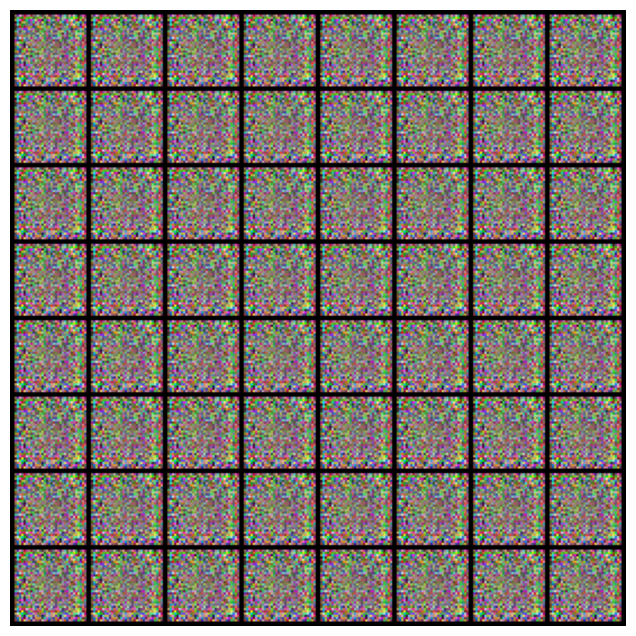

In [11]:
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i.cpu(), (1, 2, 0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

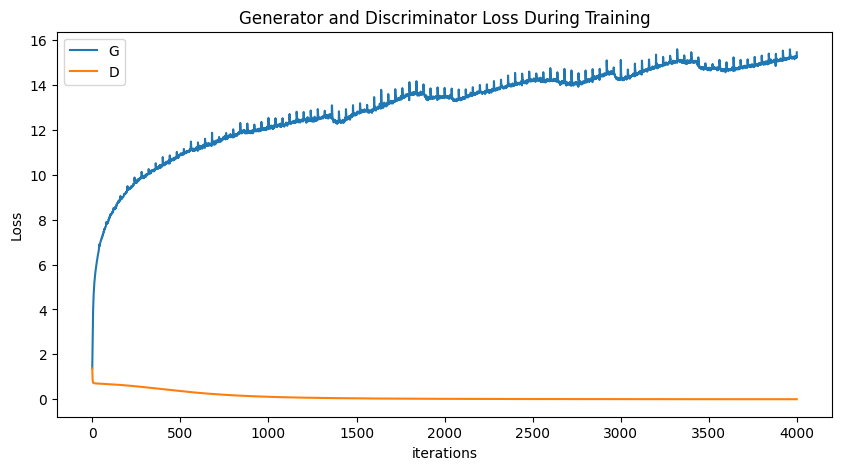

In [12]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

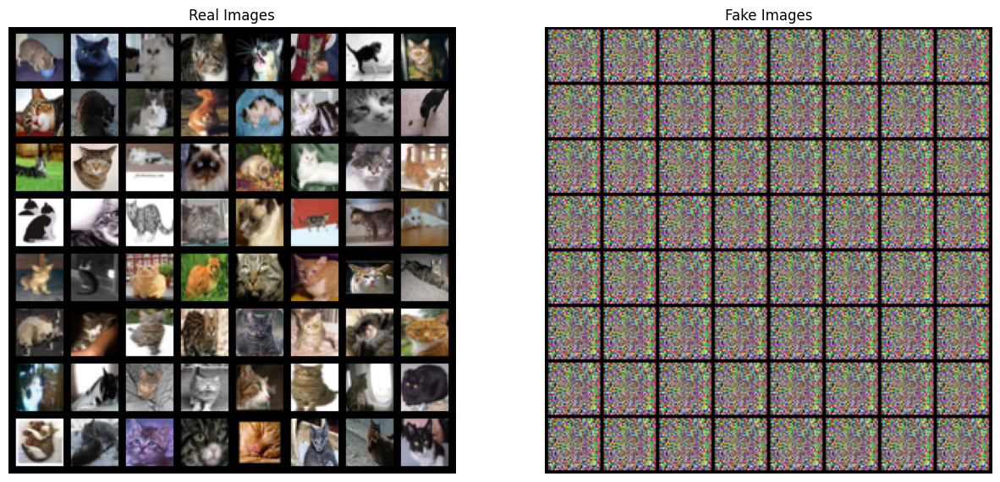

In [13]:
# Grab a batch of real images from the train_loader
real_batch = next(iter(train_loader))

# Plot the real images
plt.figure(figsize=(15,15))
plt.subplot(1,2,1)
plt.axis("off")
plt.title("Real Images")
plt.imshow(np.transpose(make_grid(real_batch[0].to(device)[:64], padding=5, normalize=True).cpu(),(1,2,0)))

# Plot the fake images from the last epoch
plt.subplot(1,2,2)
plt.axis("off")
plt.title("Fake Images")
plt.imshow(np.transpose(img_list[-1].cpu(),(1,2,0)))
plt.show()

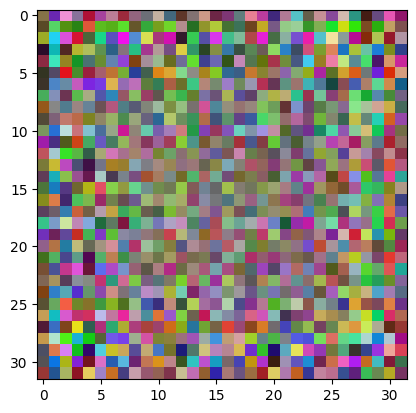

In [14]:
noise = torch.randn(1, latent_dim, 1, 1, device=device)
fake = dc_gen(noise)
fake = unnormalize(fake)
plt.imshow(fake[0].permute(1, 2, 0).cpu().detach().numpy())

## GAN

In [15]:
# Generator model
class Generator(nn.Module):
    def __init__(self, latent_dim):
        super(Generator, self).__init__()
        self.model = nn.Sequential(
            nn.Linear(latent_dim, 256),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(256, 512),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(512, 1024),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(1024, image_size),  # Output image size (3 channels, 32x32 pixels)
            nn.Tanh()  # Output pixel values in range [-1, 1]
        )

    def forward(self, z):
        img = self.model(z)
        img = img.view(img.size(0), 3, 32, 32)  # Reshape to image dimensions
        return img

In [16]:
# Discriminator model
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.model = nn.Sequential(
            nn.Linear(image_size, 512),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(512, 256),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(256, 1),
            nn.Sigmoid()  # Output probability
        )

    def forward(self, img):
        img_flat = img.view(img.size(0), -1)  # Flatten image to a vector
        validity = self.model(img_flat)
        return validity


In [17]:
generator = Generator(latent_dim).to(device)
discriminator = Discriminator().to(device)
print(generator)
print(discriminator)

# Loss
criterion = nn.BCELoss()

# Optimizers
optimizer_G = optim.Adam(generator.parameters(), lr=learning_rate, betas=(0.5, 0.999))
optimizer_D = optim.Adam(discriminator.parameters(), lr=learning_rate, betas=(0.5, 0.999))


Generator(
  (model): Sequential(
    (0): Linear(in_features=100, out_features=256, bias=True)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Linear(in_features=256, out_features=512, bias=True)
    (3): LeakyReLU(negative_slope=0.2, inplace=True)
    (4): Linear(in_features=512, out_features=1024, bias=True)
    (5): LeakyReLU(negative_slope=0.2, inplace=True)
    (6): Linear(in_features=1024, out_features=3072, bias=True)
    (7): Tanh()
  )
)
Discriminator(
  (model): Sequential(
    (0): Linear(in_features=3072, out_features=512, bias=True)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Linear(in_features=512, out_features=256, bias=True)
    (3): LeakyReLU(negative_slope=0.2, inplace=True)
    (4): Linear(in_features=256, out_features=1, bias=True)
    (5): Sigmoid()
  )
)


[Epoch 0/100] [D loss: 0.2983] [G loss: 1.0343]


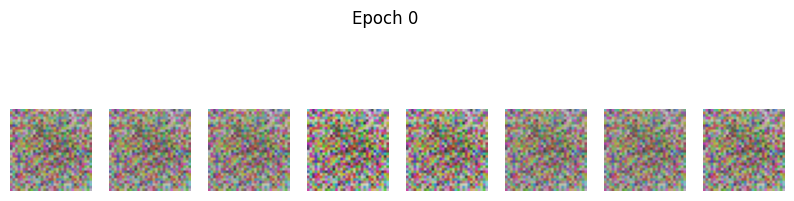

[Epoch 1/100] [D loss: 0.5376] [G loss: 0.5579]
[Epoch 2/100] [D loss: 0.3445] [G loss: 0.8500]
[Epoch 3/100] [D loss: 0.3133] [G loss: 0.7734]
[Epoch 4/100] [D loss: 0.2867] [G loss: 5.2411]
[Epoch 5/100] [D loss: 0.3284] [G loss: 1.1441]
[Epoch 6/100] [D loss: 0.1253] [G loss: 1.6766]
[Epoch 7/100] [D loss: 0.1805] [G loss: 1.7566]
[Epoch 8/100] [D loss: 0.0690] [G loss: 2.1272]
[Epoch 9/100] [D loss: 0.1203] [G loss: 1.8241]
[Epoch 10/100] [D loss: 0.0625] [G loss: 2.1869]


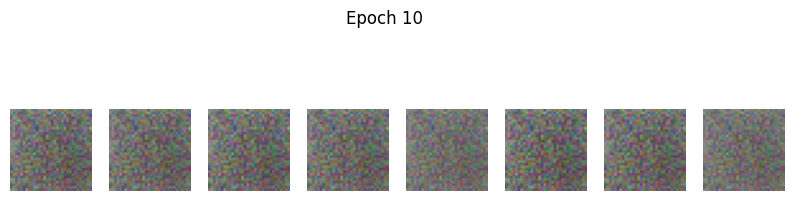

[Epoch 11/100] [D loss: 0.2516] [G loss: 5.0616]
[Epoch 12/100] [D loss: 0.1373] [G loss: 2.0559]
[Epoch 13/100] [D loss: 0.1906] [G loss: 1.8148]
[Epoch 14/100] [D loss: 0.1018] [G loss: 2.0695]
[Epoch 15/100] [D loss: 0.1755] [G loss: 4.2641]
[Epoch 16/100] [D loss: 0.2418] [G loss: 1.7186]
[Epoch 17/100] [D loss: 0.1299] [G loss: 2.9121]
[Epoch 18/100] [D loss: 0.0917] [G loss: 3.4524]
[Epoch 19/100] [D loss: 0.1114] [G loss: 2.1946]
[Epoch 20/100] [D loss: 0.3685] [G loss: 9.6705]


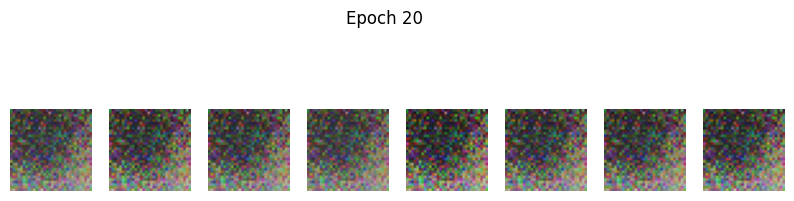

[Epoch 21/100] [D loss: 0.1310] [G loss: 1.6011]
[Epoch 22/100] [D loss: 1.4033] [G loss: 10.3410]
[Epoch 23/100] [D loss: 0.1264] [G loss: 1.6090]
[Epoch 24/100] [D loss: 0.2015] [G loss: 1.2385]
[Epoch 25/100] [D loss: 0.2545] [G loss: 1.1690]
[Epoch 26/100] [D loss: 0.4121] [G loss: 3.7375]
[Epoch 27/100] [D loss: 0.2717] [G loss: 1.5530]
[Epoch 28/100] [D loss: 0.1232] [G loss: 1.7498]
[Epoch 29/100] [D loss: 0.1813] [G loss: 1.9621]
[Epoch 30/100] [D loss: 0.1462] [G loss: 1.6550]


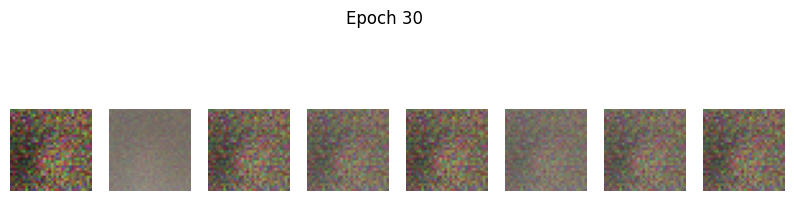

[Epoch 31/100] [D loss: 0.0819] [G loss: 1.9526]
[Epoch 32/100] [D loss: 0.1005] [G loss: 1.8363]
[Epoch 33/100] [D loss: 0.9607] [G loss: 0.9988]
[Epoch 34/100] [D loss: 0.0265] [G loss: 6.0677]
[Epoch 35/100] [D loss: 0.3231] [G loss: 2.1866]
[Epoch 36/100] [D loss: 0.1242] [G loss: 2.1062]
[Epoch 37/100] [D loss: 0.5497] [G loss: 0.7480]
[Epoch 38/100] [D loss: 0.2917] [G loss: 1.9375]
[Epoch 39/100] [D loss: 0.2799] [G loss: 1.8063]
[Epoch 40/100] [D loss: 0.1043] [G loss: 2.4242]


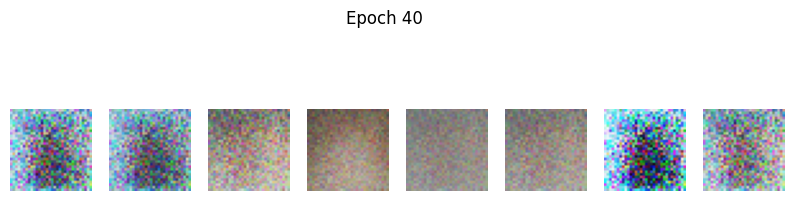

[Epoch 41/100] [D loss: 0.3411] [G loss: 2.6102]
[Epoch 42/100] [D loss: 0.7560] [G loss: 1.4312]
[Epoch 43/100] [D loss: 0.3231] [G loss: 1.6363]
[Epoch 44/100] [D loss: 0.1993] [G loss: 2.4132]
[Epoch 45/100] [D loss: 0.4952] [G loss: 2.7040]
[Epoch 46/100] [D loss: 0.0696] [G loss: 2.5569]
[Epoch 47/100] [D loss: 0.1023] [G loss: 4.6888]
[Epoch 48/100] [D loss: 0.4259] [G loss: 1.9608]
[Epoch 49/100] [D loss: 0.2769] [G loss: 1.8174]
[Epoch 50/100] [D loss: 0.4744] [G loss: 2.8152]


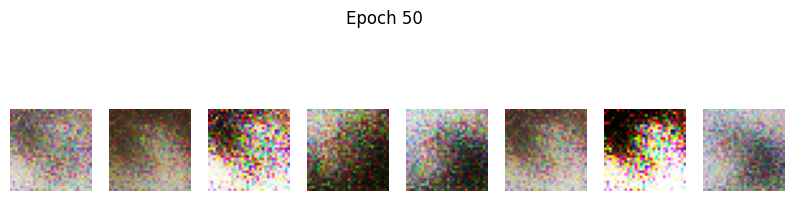

[Epoch 51/100] [D loss: 0.2030] [G loss: 2.2866]
[Epoch 52/100] [D loss: 0.4673] [G loss: 1.9486]
[Epoch 53/100] [D loss: 0.4703] [G loss: 2.9427]
[Epoch 54/100] [D loss: 0.2372] [G loss: 1.9577]
[Epoch 55/100] [D loss: 0.2979] [G loss: 1.4607]
[Epoch 56/100] [D loss: 0.5082] [G loss: 2.7702]
[Epoch 57/100] [D loss: 0.9003] [G loss: 1.3193]
[Epoch 58/100] [D loss: 0.3875] [G loss: 1.7586]
[Epoch 59/100] [D loss: 0.2831] [G loss: 1.4421]
[Epoch 60/100] [D loss: 0.2525] [G loss: 1.7147]


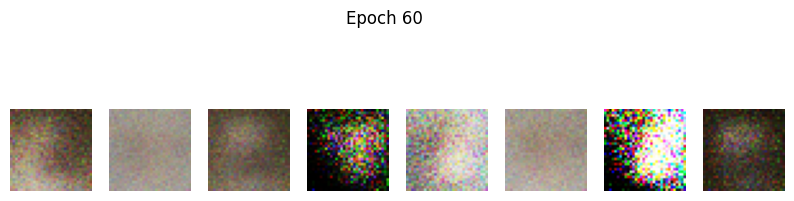

[Epoch 61/100] [D loss: 0.1817] [G loss: 2.4055]
[Epoch 62/100] [D loss: 0.6810] [G loss: 2.5525]
[Epoch 63/100] [D loss: 0.5091] [G loss: 2.2376]
[Epoch 64/100] [D loss: 0.3086] [G loss: 1.7453]
[Epoch 65/100] [D loss: 0.2639] [G loss: 1.9000]
[Epoch 66/100] [D loss: 0.1694] [G loss: 1.7371]
[Epoch 67/100] [D loss: 0.2297] [G loss: 1.3885]
[Epoch 68/100] [D loss: 0.3545] [G loss: 1.5438]
[Epoch 69/100] [D loss: 0.5661] [G loss: 1.3626]
[Epoch 70/100] [D loss: 0.1967] [G loss: 1.7022]


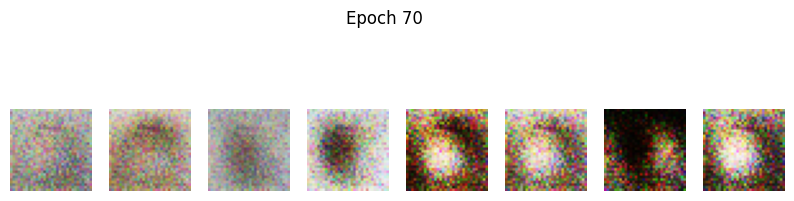

[Epoch 71/100] [D loss: 0.3754] [G loss: 1.4870]
[Epoch 72/100] [D loss: 0.2115] [G loss: 1.8612]
[Epoch 73/100] [D loss: 0.2676] [G loss: 2.5913]
[Epoch 74/100] [D loss: 0.6086] [G loss: 2.0990]
[Epoch 75/100] [D loss: 0.1979] [G loss: 1.6882]
[Epoch 76/100] [D loss: 0.5479] [G loss: 3.1288]
[Epoch 77/100] [D loss: 0.2229] [G loss: 2.0202]
[Epoch 78/100] [D loss: 0.2481] [G loss: 2.2741]
[Epoch 79/100] [D loss: 0.2379] [G loss: 1.3055]
[Epoch 80/100] [D loss: 0.2503] [G loss: 1.6441]


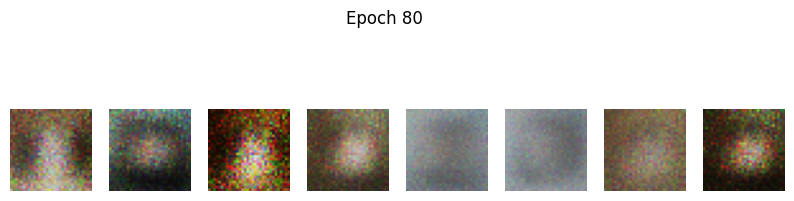

[Epoch 81/100] [D loss: 0.3346] [G loss: 1.6965]
[Epoch 82/100] [D loss: 0.5612] [G loss: 1.7161]
[Epoch 83/100] [D loss: 0.1928] [G loss: 1.7715]
[Epoch 84/100] [D loss: 0.3603] [G loss: 1.7660]
[Epoch 85/100] [D loss: 0.4530] [G loss: 1.5396]
[Epoch 86/100] [D loss: 0.7087] [G loss: 1.9424]
[Epoch 87/100] [D loss: 0.5051] [G loss: 1.9315]
[Epoch 88/100] [D loss: 0.2413] [G loss: 1.3540]
[Epoch 89/100] [D loss: 0.2168] [G loss: 1.7439]
[Epoch 90/100] [D loss: 0.3211] [G loss: 1.6000]


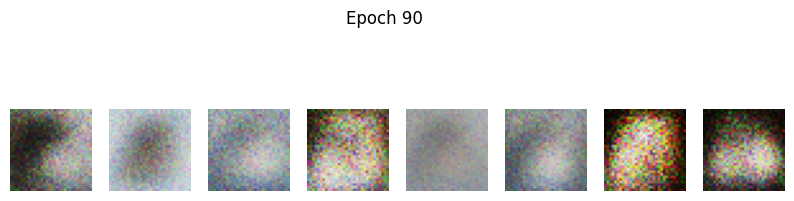

[Epoch 91/100] [D loss: 0.3667] [G loss: 1.4592]
[Epoch 92/100] [D loss: 0.4039] [G loss: 2.0634]
[Epoch 93/100] [D loss: 0.2691] [G loss: 1.5149]
[Epoch 94/100] [D loss: 0.2730] [G loss: 1.5374]
[Epoch 95/100] [D loss: 0.4027] [G loss: 2.3949]
[Epoch 96/100] [D loss: 0.5740] [G loss: 1.7375]
[Epoch 97/100] [D loss: 0.3686] [G loss: 1.6749]
[Epoch 98/100] [D loss: 0.3450] [G loss: 1.7354]
[Epoch 99/100] [D loss: 0.2320] [G loss: 1.9264]


In [18]:
# Training loop
for epoch in range(num_epochs):
    for i, (imgs, _) in enumerate(train_loader):
        
        real_images = imgs.to(device)
        batch_size = real_images.size(0)
        
        # Ground truths
        real_labels = torch.ones(batch_size, 1).to(device)
        fake_labels = torch.zeros(batch_size, 1).to(device)

        # Train Generator
        optimizer_G.zero_grad()
        z = torch.randn(batch_size, latent_dim).to(device)  
        fake_imgs = generator(z)
        # print(fake_imgs.shape) 

        g_loss = criterion(discriminator(fake_imgs), real_labels)
        g_loss.backward()

        optimizer_G.step()

        # Train Discriminator
        optimizer_D.zero_grad()
        real_outputs = discriminator(real_images)
        
        d_real_loss = criterion(real_outputs, real_labels)
        d_fake_loss = criterion(discriminator(fake_imgs.detach()), fake_labels)

        d_loss = (d_real_loss + d_fake_loss )/2
        d_loss.backward()
        optimizer_D.step()
    
    print(f"[Epoch {epoch}/{num_epochs}] [D loss: {d_loss.item():.4f}] [G loss: {g_loss.item():.4f}]")
    
    if epoch % 10 == 0:
        z = torch.randn(batch_size, latent_dim).to(device)  # Sample random noise
        gen_imgs = generator(z)  # Generate images
        gen_imgs = gen_imgs * 0.5 + 0.5  # De-normalize (scale back to [0, 1])
        labels = torch.zeros(batch_size).to(device)  # Fake labels
        show_generated_images(gen_imgs, epoch)

# # Save the models
# torch.save(generator.state_dict(), 'generator.pth')
# torch.save(discriminator.state_dict(), 'discriminator.pth')

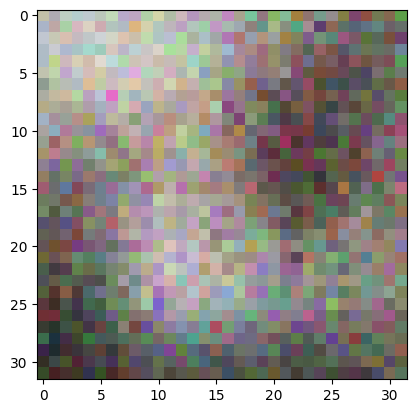

In [24]:
# generate image from the model 

z = torch.randn(1, latent_dim).to(device)
gen_img = generator(z)
gen_img = gen_img * 0.5 + 0.5 

plt.imshow(gen_img[0].permute(1, 2, 0).cpu().detach().numpy())
plt.show()